In [1]:
import os
import random
from pathlib import Path

import hdbscan
import matplotlib as mpl
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import umap
from PIL import Image
from transformers import AutoProcessor, SiglipVisionModel
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE

# check if MPS is available in pytorch
device = (
    "mps"
    if torch.backends.mps.is_available()
    else ("cuda" if torch.cuda.is_available() else "cpu")
)
print("Device:", device)

Device: cuda


In [2]:
# load the model and processor
ckpt = "google/siglip2-so400m-patch16-512"


torch_dtype = torch.float16 if device in {"mps", "cuda"} else torch.float32

processor = AutoProcessor.from_pretrained(ckpt)
model = SiglipVisionModel.from_pretrained(ckpt, torch_dtype=torch_dtype)
model = model.to(device).eval()
print(
    f"{model.num_parameters()/1e6:.0f} M params - loaded ✔ on {device} with {torch_dtype}"
)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
`torch_dtype` is deprecated! Use `dtype` instead!


429 M params - loaded ✔ on cuda with torch.float16


In [3]:
import os
from pathlib import Path  # Ensure this import is at the top of your notebook
import pandas as pd

# point this to the current directory (where the notebook is running)
repo_root = Path(os.path.abspath("."))

df = pd.read_csv("output.csv")


# function to convert Windows paths to local (POSIX) paths and make them absolute
def to_local(p: str) -> Path:
    s = str(p)
    # drop the Windows-only prefix if present
    s = s.replace("c:\\Users\\marcr\\OneDrive\\Documentos\\00_MarcRibert\\8_Programming\\01_Github\\MAST3_Feed_Or_Judge\\experiment_dms26_01\\", "")
    # convert backslashes to forward slashes
    s = s.replace("\\", "/")
    # build absolute path under your repo root
    return (repo_root / s).resolve()


for col in ["render_image_path", "reference_image_path"]:
    df[col] = df[col].apply(to_local)


# quick sanity check
missing = (
    df[~df["render_image_path"].apply(lambda p: p.exists())]["render_image_path"]
    .head(5)
    .tolist()
)
print("missing files:", missing)  # should be empty once the root is correct

# round numeric scores to nearest int (1-5) for colouring
score_cols = [
    "design_concept_strength",
    "material_strategy_coherence",
    "design_task_quality",
    "facade_potential",
    "average_score",
]
for c in score_cols:
    df[c + "_round"] = df[c].round().astype("Int64")  # keep NaN as <NA>

df.head()

missing files: []


,run_id,previous_run_id,render_image_path,material,building_type,design_strategy,reference_image_path,design_concept_strength,material_strategy_coherence,design_task_quality,...,average_score,improvement_target,success,modeling_iter,evaluation_iter,design_concept_strength_round,material_strategy_coherence_round,design_task_quality_round,facade_potential_round,average_score_round
0,4010001,NaN,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,stone,low_rise,continuity,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,4,3,2,...,2.5,design_modeling,True,1,0,4,3,2,1,2
1,4010002,NaN,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,stone,low_rise,continuity,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,4,3,2,...,2.5,design_modeling,True,1,0,4,3,2,1,2
2,4010003,NaN,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,stone,low_rise,continuity,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,4,3,2,...,2.5,design_modeling,True,1,0,4,3,2,1,2
3,4010004,NaN,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,stone,low_rise,continuity,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,4,3,2,...,2.5,design_modeling,True,1,0,4,3,2,1,2
4,4010005,NaN,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,stone,low_rise,continuity,C:\Users\marcr\OneDrive\Documentos\00_MarcRibe...,4,3,2,...,2.5,design_modeling,True,1,0,4,3,2,1,2


In [4]:
# batch‐wise embed + normalize
# takes about 12s for 64 images on M4Pro, approx 6 minutes for 2000 images
# In AsusProArt, with cpu too slow, with NvidiaRTX (cuda in cell 1) around 2 minutes for 1700 images.
# run only if ("embeddings.pt") does not exist
root = Path(os.path.abspath(""))
embeddings_file = Path(os.path.join(root, "embeddings.pt"))

paths = [p for p in df["render_image_path"].tolist()]

if os.path.exists(embeddings_file):
    print("Embeddings already exist, skipping embedding step.")
else:
    batch_size = 64
    feats = []
    for i in range(0, len(paths), batch_size):
        batch_paths = paths[i : i + batch_size]
        imgs = [Image.open(p).convert("RGB") for p in batch_paths]
        inputs = processor(images=imgs, return_tensors="pt").to(device)
        with torch.inference_mode():
            out = model(**inputs).last_hidden_state[:, 0]  # [B, hidden]
            out = out / out.norm(dim=-1, keepdim=True)  # L2 normalize
        feats.append(out.cpu())
    # 4. stack into one tensor
    embeddings = torch.cat(feats, dim=0)  # shape = [N_images, hidden_size]
    print("✔ Collected", embeddings.shape[0], "embeddings of size", embeddings.shape[1])
    save_file = Path("embeddings.pt")
    torch.save({"embeddings": embeddings, "paths": [str(p) for p in paths]}, save_file)
    print(f"Saved → {save_file} ({save_file.stat().st_size/1e6:.1f} MB)")

Embeddings already exist, skipping embedding step.


In [5]:
# --- load the saved embeddings ------------------------------------------------------
saved = torch.load(embeddings_file)  # -> {"embeddings": Tensor, "paths": list}
emb = saved["embeddings"].numpy()  # (N, D)
paths = np.array(saved["paths"])  # (N,)
print(f"Loaded {emb.shape[0]} embeddings of size {emb.shape[1]}")
print(f"Total samples: {len(df)}")


Loaded 1736 embeddings of size 1152
Total samples: 1736


In [6]:
# this cell runs 35 seconds on M4Pro
# ── 1 ▒ UMAP to 128-D (for clustering) ─────────────────────────────────────────
umap_seed = 42  # for reproducibility


umap_hi = umap.UMAP(
    n_components=128,
    n_neighbors=10,  # tighter local focus
    min_dist=0.0,
    metric="cosine",
    random_state=umap_seed,
).fit_transform(emb)


# ── 3 ▒ 2-D projection for plotting – try densMAP first ───────────────────────
umap_2d = umap.UMAP(
    n_components=2,
    n_neighbors=10,
    min_dist=0.0,
    metric="cosine",
    densmap=True,
    # output_dens=True,        # also returns local density values
    random_state=umap_seed,
).fit_transform(emb)

# If densMAP throws a warning (older umap-learn), comment densmap=… lines.

# ── 4 ▒ OPTIONAL: t-SNE view (quick) ------------------------------------------


tsne_2d = TSNE(
    n_components=2, perplexity=30, metric="cosine", init="pca", random_state=umap_seed
).fit_transform(emb)
# Choose whichever of umap_2d or tsne_2d looks clearer.

c:\Users\marcr\miniconda3\envs\feedorjudge\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\marcr\miniconda3\envs\feedorjudge\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [7]:
# Search for good HDBSCAN settings
# takes about 3 minutes on M4Pro for ~1300 settings

settings_file = Path(os.path.join(root, "hdbscan_settings.csv"))
if os.path.exists(settings_file):
    print("HDBSCAN settings already exist, skipping settings generation.")
else:

    # 1) Sanitize the embedding and break exact duplicates
    X = np.asarray(umap_hi, dtype=np.float64)
    mask = np.isfinite(X).all(axis=1)
    X = X[mask]
    # tiny jitter to avoid zero pairwise distances
    rng = np.random.RandomState(0)
    X = X + 1e-10 * rng.normal(size=X.shape)


    def n_clusters(labels):
        labels = np.asarray(labels)
        return len(np.unique(labels[labels >= 0]))


    def noise_frac(labels):
        labels = np.asarray(labels)
        return float((labels == -1).mean())


    def safe_silhouette(X, labels):
        keep = labels >= 0
        if keep.sum() < 10:
            return np.nan
        ul = np.unique(labels[keep])
        if ul.size < 2:
            return np.nan
        try:
            return float(silhouette_score(X[keep], labels[keep], metric="euclidean"))
        except Exception:
            return np.nan


    def try_one(mcs, ms, method):
        cl = hdbscan.HDBSCAN(
            min_cluster_size=mcs,
            min_samples=ms,
            metric="euclidean",
            cluster_selection_method=method,
            # optional: speeds up and is robust
            approx_min_span_tree=False,
        ).fit(X)
        labels = cl.labels_
        return {
            "min_cluster_size": mcs,
            "min_samples": ms,
            "method": method,
            "k": n_clusters(labels),
            "noise": noise_frac(labels),
            "sil": safe_silhouette(X, labels),  # higher is better
        }


    search_space = {
        "min_cluster_size": list(range(10, 100, 1)),  # smaller -> more clusters
        "min_samples": [None, 1, 3, 5, 10, 15, 20],  # smaller -> more clusters
        "method": ["leaf", "eom"],  # leaf -> more fine-grained
    }
    print(
        "Searching over",
        len(search_space["min_cluster_size"]),
        "×",
        len(search_space["min_samples"]),
        "×",
        len(search_space["method"]),
        "=",
        len(search_space["min_cluster_size"])
        * len(search_space["min_samples"])
        * len(search_space["method"]),
        "HDBSCAN settings",
    )
    rows = []
    for mcs in search_space["min_cluster_size"]:
        for ms in search_space["min_samples"]:
            for method in search_space["method"]:
                rows.append(try_one(mcs, ms, method))

    df_hdbscan_settings = pd.DataFrame(rows)
    #save the settings
    df_hdbscan_settings.to_csv(settings_file, index=False)
    print(f"Saved {settings_file}")

HDBSCAN settings already exist, skipping settings generation.


In [8]:
#load the settings if needed
df_hdbscan_settings = pd.read_csv(settings_file)
# df_hdbscan_settings has: min_cluster_size, min_samples, method, k, noise, sil

# 1) make a tuple column of settings
dfg = df_hdbscan_settings.copy()
dfg["param"] = list(zip(dfg["min_cluster_size"], dfg["min_samples"], dfg["method"]))

# 2) round metrics for stable grouping
DEC = 3  # change if you want finer or coarser merging
dfg["noise_r"] = dfg["noise"].round(DEC)
dfg["sil_r"] = dfg["sil"].round(DEC)

# 3) keep only some clusters
min_cluster_count = 9
max_cluster_count = 9
mask = dfg["k"].between(min_cluster_count, max_cluster_count)
df_focus = dfg[mask]

# 4) group by the metric triple and collect unique setting tuples
grouped = (
    df_focus.groupby(["k", "noise_r", "sil_r"], as_index=False)
    .agg(n_configs=("param", "size"), params=("param", lambda xs: sorted(set(xs))))
    .sort_values(
        ["sil_r", "noise_r", "k", "n_configs"], ascending=[False, True, True, False]
    )
)

print(
    "Unique (k, noise, sil) triples and which (min_cluster_size, min_samples, method) produce them"
)
print(grouped.to_string(index=False))

Unique (k, noise, sil) triples and which (min_cluster_size, min_samples, method) produce them
 k  noise_r  sil_r  n_configs                                                                                                                                                                                                                                                                                                                                                                   params
 9    0.358  0.562          1                                                                                                                                                                                                                                                                                                                                                        [(35, nan, leaf)]
 9    0.361  0.562          1                                                                                               

In [54]:
# ── HDBSCAN on the higher-dim space ───────────────────────────────────────
# try different values here,

selected_settings = [  
    # Highest silhouette - leaf method
    [35, None, "leaf"],      # sil=0.562, noise=0.358
    
    # Lowest noise - eom method  
    [45, 5, "eom"],          # sil=0.423, noise=0.145
    [50, 5, "eom"],          # sil=0.421, noise=0.143
    
    # Balanced performance - mixed methods
    [55, 10, "leaf"],        # sil=0.485, noise=0.233 
    [45, 10, "leaf"],        # leaf alternative
    [50, 10, "eom"],         # eom alternative for comparison
    
    # Good silhouette + low noise - mixed methods
    [55, 15, "leaf"],        # sil=0.513, noise=0.241
    [50, 15, "eom"],         # eom alternative
    [40, 15, "leaf"],        # leaf with smaller cluster size
    
    # Strong silhouette - mixed methods
    [50, 20, "leaf"],        # sil=0.532, noise=0.267
    [40, 20, "leaf"],        # leaf with smaller cluster size
    [45, 20, "eom"],         # eom alternative
    [65, 20, "leaf"],        # leaf with larger cluster size
    
    # Parameter diversity
    [60, 3, "leaf"],         # sil=0.479, noise=0.317
]
# min_cluster_size = 40  # 40 #64
# min_samples = None  # None # 10
# method = "eom"  #'eom' or 'leaf'
min_cluster_size, min_samples, method = selected_settings[13]
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=min_cluster_size,
    min_samples=min_samples,
    metric="euclidean",
    cluster_selection_method=method,
).fit(umap_hi)
labels = clusterer.labels_

In [55]:
# ── 5 ▒ Update dataframe & re-plot eight static panels ─────────────────────────
# option with umap
df["x"], df["y"], df["cluster"] = umap_2d[:, 0], umap_2d[:, 1], labels

# ── FILTER OUT GLASS MATERIAL FOR PLOTTING ────────────────────────────────────
# Keep clustering on all data, but create filtered version for visualization
df_plot = df[df["material"] != "glass"].copy()
print(f"Total samples with clusters: {len(df)}")
print(f"Filtered for plotting (excluding glass): {len(df_plot)} samples")
print(f"Excluded glass samples: {len(df) - len(df_plot)}")

Total samples with clusters: 1736
Filtered for plotting (excluding glass): 1451 samples
Excluded glass samples: 285


In [56]:
# ── CLUSTER QUALITY METRICS: Material Alignment & Score Distribution ──────────
from sklearn.metrics import (
    normalized_mutual_info_score, 
    adjusted_rand_score,
    homogeneity_completeness_v_measure
)

# ── 1. Global Clustering vs Material Alignment Metrics ─────────────────────────
# Exclude noise points (cluster == -1) for fair comparison
mask = df_plot['cluster'] >= 0
labels_clean = df_plot.loc[mask, 'cluster']
materials_clean = df_plot.loc[mask, 'material']

# Standard clustering quality metrics
nmi = normalized_mutual_info_score(materials_clean, labels_clean)
ari = adjusted_rand_score(materials_clean, labels_clean)
homogeneity, completeness, v_measure = homogeneity_completeness_v_measure(materials_clean, labels_clean)

print("=" * 70)
print("CLUSTER-MATERIAL ALIGNMENT METRICS (higher = better separation)")
print("=" * 70)
print(f"  Normalized Mutual Information (NMI): {nmi:.3f}")
print(f"  Adjusted Rand Index (ARI):           {ari:.3f}")
print(f"  Homogeneity (each cluster → 1 mat):  {homogeneity:.3f}")
print(f"  Completeness (each mat → 1 cluster): {completeness:.3f}")
print(f"  V-Measure (harmonic mean H&C):       {v_measure:.3f}")
print(f"  Noise fraction:                      {(df_plot['cluster'] == -1).mean():.1%}")
print()

# ── 2. Per-Cluster Material Purity & Score Quality ─────────────────────────────
def cluster_quality_summary(df, material_col='material', score_col='average_score', cluster_col='cluster'):
    """Compute per-cluster quality metrics."""
    results = []
    for cid in sorted(df[cluster_col].unique()):
        subset = df[df[cluster_col] == cid]
        mat_counts = subset[material_col].value_counts()
        dominant_material = mat_counts.index[0]
        purity = mat_counts.iloc[0] / len(subset)
        
        mean_score = subset[score_col].mean()
        std_score = subset[score_col].std()
        cv = std_score / mean_score if mean_score > 0 else np.nan  # coefficient of variation
        
        # Composite quality: high purity + high score + low variance
        quality_index = purity * mean_score / (1 + cv) if not np.isnan(cv) else purity * mean_score
        
        results.append({
            'cluster': cid,
            'n_samples': len(subset),
            'dominant_material': dominant_material,
            'purity': purity,
            'mean_score': mean_score,
            'std_score': std_score,
            'cv': cv,
            'quality_index': quality_index,
            'materials_in_cluster': ', '.join(f"{m}({c})" for m, c in mat_counts.items())
        })
    return pd.DataFrame(results)

df_cluster_quality = cluster_quality_summary(df_plot)
print("PER-CLUSTER QUALITY SUMMARY")
print("-" * 70)
print(df_cluster_quality[['cluster', 'n_samples', 'dominant_material', 'purity', 
                          'mean_score', 'std_score', 'quality_index']].to_string(index=False))
print()

# ── 3. Per Material-Cluster Pair Analysis ──────────────────────────────────────
print("MATERIAL × CLUSTER DISTRIBUTION (score quality per combination)")
print("-" * 70)
material_cluster_summary = df_plot[df_plot['cluster'] >= 0].groupby(['material', 'cluster']).agg(
    n=('average_score', 'count'),
    mean=('average_score', 'mean'),
    std=('average_score', 'std'),
).reset_index()
material_cluster_summary['cv'] = material_cluster_summary['std'] / material_cluster_summary['mean']
material_cluster_summary['quality'] = (
    material_cluster_summary['n'] * material_cluster_summary['mean'] / 
    (1 + material_cluster_summary['cv'].fillna(0))
)
material_cluster_summary = material_cluster_summary.sort_values('quality', ascending=False)
print(material_cluster_summary.round(3).to_string(index=False))
print()

# ── 4. Material Separation Success Summary ─────────────────────────────────────
print("MATERIAL SEPARATION SUCCESS")
print("-" * 70)
for mat in sorted(df_plot['material'].unique()):
    mat_df = df_plot[(df_plot['material'] == mat) & (df_plot['cluster'] >= 0)]
    if len(mat_df) == 0:
        continue
    cluster_dist = mat_df['cluster'].value_counts(normalize=True)
    top_cluster = cluster_dist.index[0]
    concentration = cluster_dist.iloc[0]  # fraction in dominant cluster
    n_clusters = len(cluster_dist)
    mean_score = mat_df['average_score'].mean()
    
    status = "✓ GOOD" if concentration >= 0.5 else ("~ MIXED" if concentration >= 0.3 else "✗ SPREAD")
    print(f"  {mat:12s}: {concentration:5.1%} in cluster {top_cluster:2d} | "
          f"spread across {n_clusters} clusters | mean score: {mean_score:.2f} | {status}")

# ── 5. SAVE RESULTS TO CSV (APPEND MODE) ───────────────────────────────────────
output_dir = repo_root / "04_plots/clustering_quality"
output_dir.mkdir(parents=True, exist_ok=True)

# 5.1 Global metrics
n_clusters_found = len([c for c in df_plot['cluster'].unique() if c >= 0])
global_metrics = pd.DataFrame([{
    'min_cluster_size': min_cluster_size,
    'min_samples': min_samples if min_samples is not None else 'None',
    'method': method,
    'n_clusters': n_clusters_found,
    'NMI': round(nmi, 4),
    'ARI': round(ari, 4),
    'homogeneity': round(homogeneity, 4),
    'completeness': round(completeness, 4),
    'v_measure': round(v_measure, 4),
    'noise_fraction': round((df_plot['cluster'] == -1).mean(), 4),
}])

global_file = output_dir / "clustering_global_metrics.csv"
if global_file.exists():
    global_metrics.to_csv(global_file, mode='a', header=False, index=False)
else:
    global_metrics.to_csv(global_file, index=False)

# 5.2 Per-cluster quality (add parameter columns)
df_cluster_quality_save = df_cluster_quality.copy()
df_cluster_quality_save.insert(0, 'method', method)
df_cluster_quality_save.insert(0, 'min_samples', min_samples if min_samples is not None else 'None')
df_cluster_quality_save.insert(0, 'min_cluster_size', min_cluster_size)

cluster_file = output_dir / "clustering_per_cluster_quality.csv"
if cluster_file.exists():
    df_cluster_quality_save.to_csv(cluster_file, mode='a', header=False, index=False)
else:
    df_cluster_quality_save.to_csv(cluster_file, index=False)

# 5.3 Material-cluster distribution (add parameter columns)
material_cluster_save = material_cluster_summary.copy()
material_cluster_save.insert(0, 'method', method)
material_cluster_save.insert(0, 'min_samples', min_samples if min_samples is not None else 'None')
material_cluster_save.insert(0, 'min_cluster_size', min_cluster_size)

material_file = output_dir / "clustering_material_cluster_dist.csv"
if material_file.exists():
    material_cluster_save.to_csv(material_file, mode='a', header=False, index=False)
else:
    material_cluster_save.to_csv(material_file, index=False)

print()
print("=" * 70)
print("RESULTS SAVED TO:")
print(f"  • {global_file.relative_to(repo_root)}")
print(f"  • {cluster_file.relative_to(repo_root)}")
print(f"  • {material_file.relative_to(repo_root)}")
print("=" * 70)


CLUSTER-MATERIAL ALIGNMENT METRICS (higher = better separation)
  Normalized Mutual Information (NMI): 0.026
  Adjusted Rand Index (ARI):           0.010
  Homogeneity (each cluster → 1 mat):  0.030
  Completeness (each mat → 1 cluster): 0.023
  V-Measure (harmonic mean H&C):       0.026
  Noise fraction:                      31.8%

PER-CLUSTER QUALITY SUMMARY
----------------------------------------------------------------------
 cluster  n_samples dominant_material   purity  mean_score  std_score  quality_index
      -1        462             stone 0.372294    2.533550   0.314525       0.839062
       0         82          concrete 0.341463    2.646341   0.207689       0.837871
       1        272          concrete 0.250000    2.674632   0.287051       0.603851
       2        111             metal 0.261261    2.617117   0.295458       0.614390
       3        104          concrete 0.326923    2.449519   0.320004       0.708276
       4         91          concrete 0.274725    2.6098

In [ ]:
# ── VISUALIZE CLUSTER-MATERIAL ALIGNMENT ───────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# 1. Confusion matrix: Material vs Cluster (heatmap)
ax1 = axes[0]
confusion = pd.crosstab(
    df_plot[df_plot['cluster'] >= 0]['material'], 
    df_plot[df_plot['cluster'] >= 0]['cluster'],
    normalize='index'  # row-normalize: shows where each material ends up
)
sns.heatmap(confusion, annot=True, fmt='.2f', cmap='Blues', ax=ax1, cbar_kws={'label': 'Fraction'})
ax1.set_title('Material → Cluster Distribution\n(row-normalized: where does each material go?)')
ax1.set_xlabel('Cluster')
ax1.set_ylabel('Material')

# 2. Cluster purity + mean score
ax2 = axes[1]
df_cq = df_cluster_quality[df_cluster_quality['cluster'] >= 0].copy()
x = np.arange(len(df_cq))
width = 0.35
bars1 = ax2.bar(x - width/2, df_cq['purity'], width, label='Purity', color='steelblue', alpha=0.8)
ax2.set_ylabel('Purity', color='steelblue')
ax2.tick_params(axis='y', labelcolor='steelblue')
ax2.set_ylim(0, 1.1)

ax2b = ax2.twinx()
bars2 = ax2b.bar(x + width/2, df_cq['mean_score'], width, label='Mean Score', color='coral', alpha=0.8)
ax2b.set_ylabel('Mean Score', color='coral')
ax2b.tick_params(axis='y', labelcolor='coral')
ax2b.set_ylim(0, 5.5)

ax2.set_xticks(x)
ax2.set_xticklabels([f"C{c}\n({m})" for c, m in zip(df_cq['cluster'], df_cq['dominant_material'])], fontsize=8)
ax2.set_xlabel('Cluster (dominant material)')
ax2.set_title('Cluster Quality: Purity vs Mean Score')
ax2.legend(loc='upper left')
ax2b.legend(loc='upper right')

# 3. Score distribution per cluster (boxplot)
ax3 = axes[2]
cluster_order = sorted([c for c in df_plot['cluster'].unique() if c >= 0])
df_plot_filtered = df_plot[df_plot['cluster'] >= 0]
sns.boxplot(data=df_plot_filtered, x='cluster', y='average_score', hue='material', 
            order=cluster_order, ax=ax3, palette='Set2')
ax3.set_title('Score Distribution by Cluster & Material')
ax3.set_xlabel('Cluster')
ax3.set_ylabel('Average Score')
ax3.legend(title='Material', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=8)

plt.tight_layout()
plt.suptitle(f'Cluster Quality Assessment | NMI={nmi:.3f}, V-measure={v_measure:.3f}', 
             y=1.02, fontsize=12, fontweight='bold')
plt.show()

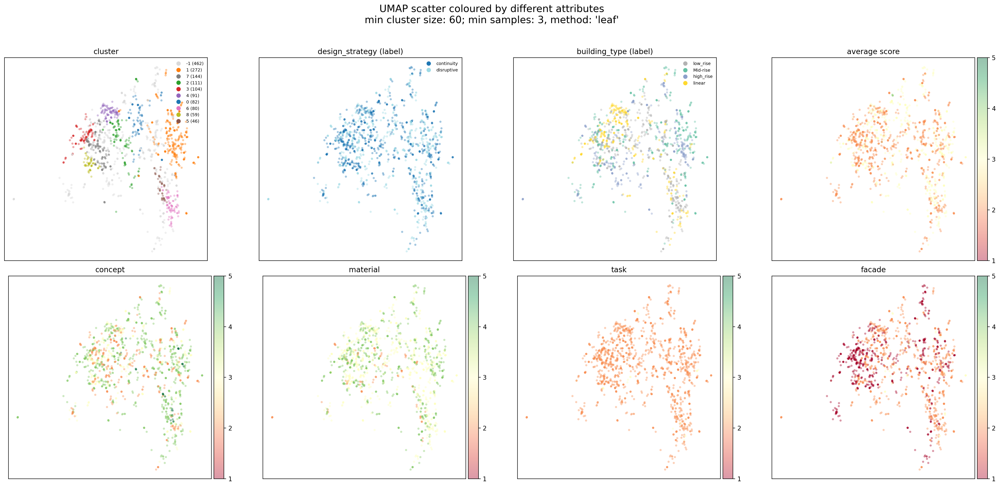

In [123]:
# ── CONFIG ────────────────────────────────────────────────────────────────────
DOT_ALPHA, DOT_SIZE = 0.4, 12
MAX_LEGEND = 30

SHARED_NORM = Normalize(vmin=1, vmax=5)  # same range for all numeric panels

# ── PALETTE FOR CLUSTERS ------------------------------------------------------
# tab10 = mpl.colormaps["tab10"]
tab10 = mpl.colormaps["tab10"]
cluster_palette = {-1: "#d9d9d9"}  # grey for noise
for i, cid in enumerate(sorted(c for c in df_plot.cluster.unique() if c != -1)):
    cluster_palette[cid] = mpl.colors.to_hex(tab10(i % 10))

# helper: human-readable label with counts (from filtered data)
cluster_counts = df_plot.cluster.value_counts().to_dict()


def cluster_label(cid):
    return f"{cid} ({cluster_counts[cid]})"


# ── GENERIC PALETTE MAKER FOR OTHER CATEGORICAL COLUMNS -----------------------
def make_palette(categories, cmap_name):
    cmap = mpl.colormaps[cmap_name]
    return {
        cat: mpl.colors.to_hex(cmap(i / max(len(categories) - 1, 1)))
        for i, cat in enumerate(categories)
    }


# ── SCATTER PANEL -------------------------------------------------------------
def add_panel(
    ax,
    x,
    y,
    colour_vec,
    *,
    title,
    palette=None,
    continuous=False,
    cmap_name="RdYlGn",
    legend_labels=None,
    norm=None,
):

    if continuous:  # numeric colour-bar
        sc = ax.scatter(
            x,
            y,
            c=colour_vec,
            cmap=cmap_name,
            norm=norm or mpl.colors.Normalize(),
            s=DOT_SIZE,
            alpha=DOT_ALPHA,
            lw=0,
        )
        cbar = plt.colorbar(sc, ax=ax, pad=0.01, fraction=0.05)
        cbar.set_ticks([1, 2, 3, 4, 5])
        # plt.colorbar(sc, ax=ax, pad=0.01, fraction=0.05)

    else:  # categorical colouring
        if palette is None or isinstance(palette, str):
            palette = make_palette(np.unique(colour_vec), palette or cmap_name)
        colours = pd.Series(colour_vec).map(palette)
        sc = ax.scatter(x, y, c=colours, s=DOT_SIZE, alpha=DOT_ALPHA, lw=0)

        if legend_labels is None:  # default: use the raw category value
            legend_labels = {cat: cat for cat in np.unique(colour_vec)}

        # build legend (largest to smallest, max N)
        freq = pd.Series(colour_vec).value_counts()
        order = freq.index[:MAX_LEGEND]
        handles = [
            plt.Line2D([], [], marker="o", ls="", color=palette[o], markersize=6)
            for o in order
        ]
        ax.legend(
            handles,
            [legend_labels[o] for o in order],
            loc="upper right",
            frameon=False,
            fontsize=7,
        )

    ax.set(title=title, xticks=[], yticks=[])
    ax.set_box_aspect(1)


# ── FIGURE LAYOUT -------------------------------------------------------------
fig, axes = plt.subplots(2, 4, figsize=(23, 11), dpi=200)
axes = axes.ravel()

panels = [
    # title                    colour-vec                         cont? palette / cmap  legend_label_map
    (
        "cluster",
        df_plot.cluster,
        False,
        cluster_palette,
        {cid: cluster_label(cid) for cid in df_plot.cluster.unique()},
    ),
    ("design_strategy (label)", df_plot.design_strategy.fillna("⟂"), False, "tab20", None),
    ("building_type (label)", df_plot.building_type.fillna("⟂"), False, "Set2", None),
    ("average score", df_plot.average_score_round, True, "RdYlGn", None),
    ("concept", df_plot.design_concept_strength_round, True, "RdYlGn", None),
    ("material", df_plot.material_strategy_coherence_round, True, "RdYlGn", None),
    ("task", df_plot.design_task_quality_round, True, "RdYlGn", None),
    ("facade", df_plot.facade_potential_round, True, "RdYlGn", None),
]

for ax, (title, col, cont, pal, lab_map) in zip(axes, panels):
    add_panel(
        ax,
        df_plot.x,
        df_plot.y,
        col,
        title=title,
        continuous=cont,
        palette=pal,
        cmap_name=pal if cont else None,
        legend_labels=lab_map,
        norm=SHARED_NORM if cont else None,
    )

fig.suptitle(
    f"UMAP scatter coloured by different attributes\nmin cluster size: {min_cluster_size}; min samples: {min_samples}, method: '{method}'",
    fontsize=16,
    y=0.99,
)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig(
    f"{min_cluster_size}_{min_samples}_{method}_clusters_overview.png",
    dpi=200,
    bbox_inches="tight",
)
# save as pdf
plt.savefig(
    f"{min_cluster_size}_{min_samples}_{method}_clusters_overview.pdf",
    dpi=200,
    bbox_inches="tight",
)
plt.show()

In [124]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

max_cluster_id = df_plot.cluster.max()

picks = []
for cid, clust in df_plot.groupby("cluster", sort=True):

    if cid == -1 or len(clust) < max_cluster_id:  # skip noise / very small clusters
        continue

    clust_sorted = clust.sort_values("average_score")  # raw continuous score
    n = len(clust_sorted)

    # indices for bottom-3, mid-3, top-3 (handles any cluster size ≥ 9)
    idx_low = np.linspace(0, n / 3, 3, endpoint=False, dtype=int)
    idx_mid = np.linspace(n / 3, 2 * n / 3, 3, endpoint=False, dtype=int)
    idx_high = np.linspace(2 * n / 3, n - 1e-9, 3, endpoint=False, dtype=int)

    sample = pd.concat(
        [
            clust_sorted.iloc[idx_low].assign(tier="low"),
            clust_sorted.iloc[idx_mid].assign(tier="mid"),
            clust_sorted.iloc[idx_high].assign(tier="high"),
        ]
    )

    picks.append(sample)

selected_df = pd.concat(picks, ignore_index=True)
selected_paths = selected_df.render_image_path.tolist()
print(
    f"Sampled {len(selected_df)} images from {selected_df.cluster.nunique()} clusters"
)
print(f"Picked exactly 9 images from each of {selected_df.cluster.nunique()} clusters.")

Sampled 81 images from 9 clusters
Picked exactly 9 images from each of 9 clusters.


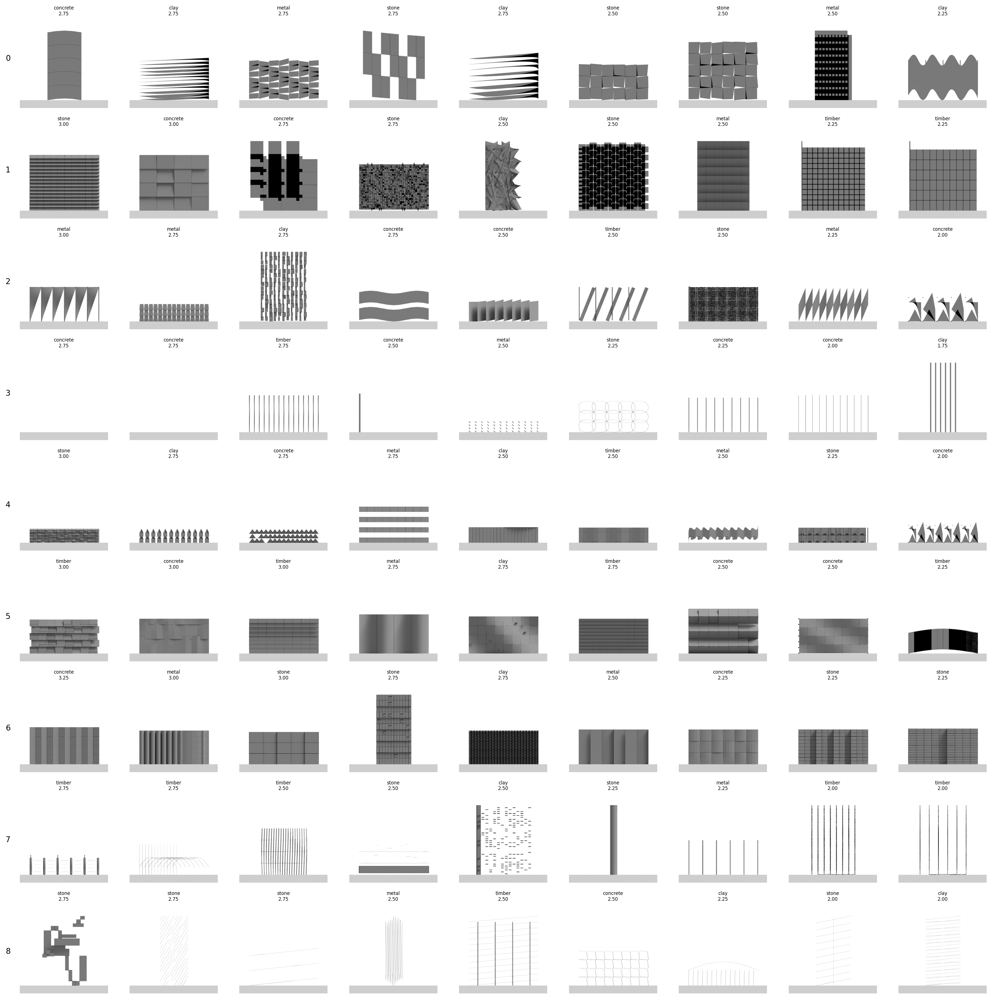

In [125]:
rows = selected_df.cluster.nunique()
tiers = {"high": 0, "mid": 1, "low": 2}  # left→right order
fig, axes = plt.subplots(rows, 9, figsize=(18, 2 * rows), dpi=200)
axes = np.atleast_2d(axes)

for r, cid in enumerate(sorted(selected_df.cluster.unique())):
    # row_df = selected_df[selected_df.cluster == cid].sort_values(
    #     "tier", key=lambda s: s.map(tiers)
    # )
    row_df = selected_df[selected_df.cluster == cid].sort_values(
        "average_score", ascending=False
    )  # ← score high→low

    # row label – cluster number on the left margin
    fig.text(
        0.005,  # x in figure coords
        1 - (r + 0.55) / rows,  # y centre of the row
        f"{cid}",
        fontsize=10,
        ha="left",
        va="center",
    )

    for c, (_, item) in enumerate(row_df.iterrows()):
        ax = axes[r, c]
        ax.imshow(Image.open(item.render_image_path))
        #ax.set_title(f"{item.tier}\n{item.material}\n{item.average_score:.2f}", fontsize=6)
        ax.set_title(f"{item.material}\n{item.average_score:.2f}", fontsize=6)
        ax.axis("off")

    # hide any empty cells (just in case)
    for c in range(len(row_df), 9):
        axes[r, c].axis("off")

plt.tight_layout(w_pad=0.1)
# Path("output/evaluation_charts").mkdir(parents=True, exist_ok=True)
plt.savefig(
    f"{min_cluster_size}_{min_samples}_{method}_clusters_samples.png",
    dpi=200,
    bbox_inches="tight",
)
# save as pdf
plt.savefig(
    f"{min_cluster_size}_{min_samples}_{method}_clusters_samples.pdf",
    dpi=200,
    bbox_inches="tight",
)
plt.show()

In [126]:
# ── MATERIAL DISTRIBUTION ANALYSIS ──────────────────────────────────────────
print("Material Distribution within Clusters (excluding glass)")
print("=" * 50)

# Calculate material proportions within each cluster
cluster_material_analysis = []
for cid in sorted(df_plot.cluster.unique()):
    if cid == -1:  # Skip noise cluster
        continue
    
    cluster_data = df_plot[df_plot.cluster == cid]
    total_in_cluster = len(cluster_data)
    
    material_counts = cluster_data['material'].value_counts()
    material_props = (material_counts / total_in_cluster * 100).round(1)
    
    print(f"\nCluster {cid} (n={total_in_cluster}):")
    for material, percentage in material_props.items():
        count = material_counts[material]
        print(f"  {material}: {count} samples ({percentage}%)")
        
        cluster_material_analysis.append({
            'cluster': cid,
            'material': material,
            'count': count,
            'percentage': percentage,
            'cluster_size': total_in_cluster
        })

# Create summary DataFrame
material_analysis_df = pd.DataFrame(cluster_material_analysis)

# Create pivot table for easier visualization
material_pivot = material_analysis_df.pivot_table(
    index='cluster', 
    columns='material', 
    values='percentage', 
    fill_value=0
).round(1)

print(f"\n\nMaterial Percentage Distribution by Cluster:")
print("=" * 60)
print(material_pivot.to_string())

# Calculate material purity (max percentage in each cluster)
print(f"\n\nCluster Material Purity:")
print("=" * 30)
for cid in material_pivot.index:
    max_material = material_pivot.loc[cid].idxmax()
    max_percentage = material_pivot.loc[cid].max()
    print(f"Cluster {cid}: {max_percentage}% {max_material}")

# Overall material distribution
print(f"\n\nOverall Material Distribution (excluding glass):")
print("=" * 35)
overall_material_dist = df_plot['material'].value_counts(normalize=True) * 100
for material, percentage in overall_material_dist.items():
    count = df_plot['material'].value_counts()[material]
    print(f"{material}: {count} samples ({percentage:.1f}%)")

Material Distribution within Clusters (excluding glass)

Cluster 0 (n=82):
  concrete: 28 samples (34.1%)
  clay: 20 samples (24.4%)
  timber: 13 samples (15.9%)
  stone: 11 samples (13.4%)
  metal: 10 samples (12.2%)

Cluster 1 (n=272):
  concrete: 68 samples (25.0%)
  stone: 67 samples (24.6%)
  metal: 67 samples (24.6%)
  timber: 37 samples (13.6%)
  clay: 33 samples (12.1%)

Cluster 2 (n=111):
  metal: 29 samples (26.1%)
  clay: 25 samples (22.5%)
  concrete: 20 samples (18.0%)
  timber: 19 samples (17.1%)
  stone: 18 samples (16.2%)

Cluster 3 (n=104):
  concrete: 34 samples (32.7%)
  stone: 31 samples (29.8%)
  timber: 21 samples (20.2%)
  clay: 11 samples (10.6%)
  metal: 7 samples (6.7%)

Cluster 4 (n=91):
  concrete: 25 samples (27.5%)
  stone: 20 samples (22.0%)
  clay: 19 samples (20.9%)
  metal: 15 samples (16.5%)
  timber: 12 samples (13.2%)

Cluster 5 (n=46):
  timber: 15 samples (32.6%)
  concrete: 14 samples (30.4%)
  stone: 7 samples (15.2%)
  clay: 5 samples (10.9%)
 

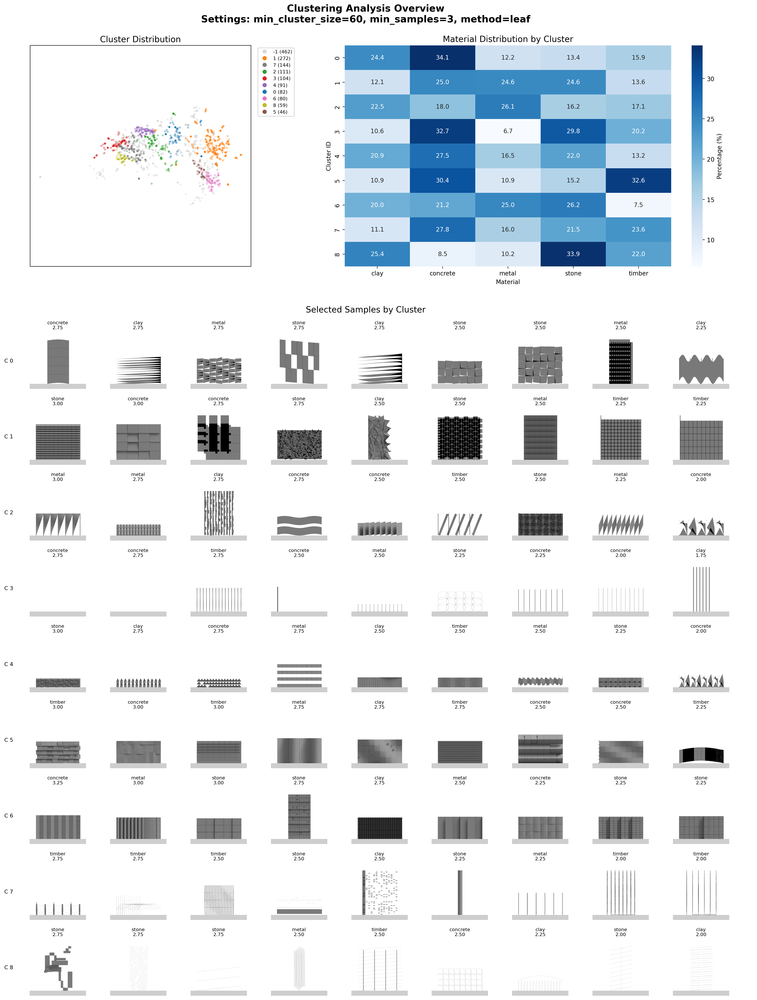

In [127]:
# ── COMBINED FIGURE: 4 QUADRANT LAYOUT ─────────────────────────────────────
# Top left: Cluster scatter | Top right: Material heatmap
# Bottom (full width): Sample images grid

num_sample_rows = selected_df.cluster.nunique()

# Create figure with adequate height for all components
fig = plt.figure(figsize=(20, 24), dpi=200)

# Use gridspec: 2 rows, 2 columns
# Row 0 = top quadrants (cluster + heatmap)
# Row 1 = bottom half (samples spanning both columns)
gs = fig.add_gridspec(2, 2, height_ratios=[1, 3.0], width_ratios=[1, 1.5],
                       hspace=0.15, wspace=0.20,
                       left=0.08, right=0.95, top=0.94, bottom=0.02)

# ═══════════════════════════════════════════════════════════════════════════
# 1. CLUSTER SCATTER PLOT (top left)
# ═══════════════════════════════════════════════════════════════════════════
ax_cluster = fig.add_subplot(gs[0, 0])

cluster_counts = df_plot.cluster.value_counts().to_dict()
def cluster_label(cid):
    return f"{cid} ({cluster_counts[cid]})"

tab10 = mpl.colormaps["tab10"]
cluster_palette = {-1: "#d9d9d9"}
for i, cid in enumerate(sorted(c for c in df_plot.cluster.unique() if c != -1)):
    cluster_palette[cid] = mpl.colors.to_hex(tab10(i % 10))

colour_vec = df_plot.cluster
colours = pd.Series(colour_vec).map(cluster_palette)
sc = ax_cluster.scatter(df_plot.x, df_plot.y, c=colours, s=DOT_SIZE, alpha=DOT_ALPHA, lw=0)

legend_labels = {cid: cluster_label(cid) for cid in df_plot.cluster.unique()}
freq = pd.Series(colour_vec).value_counts()
order = freq.index[:MAX_LEGEND]
handles = [
    plt.Line2D([], [], marker="o", ls="", color=cluster_palette[o], markersize=6)
    for o in order
]
ax_cluster.legend(
    handles,
    [legend_labels[o] for o in order],
    loc="upper left",
    bbox_to_anchor=(1.02, 1.0),
    frameon=True,
    fancybox=True,
    framealpha=0.9,
    fontsize=8,
)
ax_cluster.set_title("Cluster Distribution", fontsize=14)
ax_cluster.set(xticks=[], yticks=[])
ax_cluster.set_aspect('equal', adjustable='datalim')
ax_cluster.set_box_aspect(1)  # Force square aspect

# ═══════════════════════════════════════════════════════════════════════════
# 2. MATERIAL DISTRIBUTION HEATMAP (top right)
# ═══════════════════════════════════════════════════════════════════════════
ax_heatmap = fig.add_subplot(gs[0, 1])

cluster_material_analysis = []
for cid in sorted(df_plot.cluster.unique()):
    if cid == -1:
        continue
    
    cluster_data = df_plot[df_plot.cluster == cid]
    total_in_cluster = len(cluster_data)
    material_counts = cluster_data['material'].value_counts()
    material_props = (material_counts / total_in_cluster * 100).round(1)
    
    for material, percentage in material_props.items():
        count = material_counts[material]
        cluster_material_analysis.append({
            'cluster': cid,
            'material': material,
            'count': count,
            'percentage': percentage,
            'cluster_size': total_in_cluster
        })

material_analysis_df = pd.DataFrame(cluster_material_analysis)
material_pivot = material_analysis_df.pivot_table(
    index='cluster', 
    columns='material', 
    values='percentage', 
    fill_value=0
).round(1)

material_pivot_sorted = material_pivot.sort_index(ascending=True)
sns.heatmap(material_pivot_sorted, annot=True, fmt='.1f', cmap='Blues', 
            cbar_kws={'label': 'Percentage (%)'}, 
            ax=ax_heatmap)
ax_heatmap.set_title('Material Distribution by Cluster', fontsize=14)
ax_heatmap.set_xlabel('Material')
ax_heatmap.set_ylabel('Cluster ID')

# ═══════════════════════════════════════════════════════════════════════════
# 3. SELECTED SAMPLES GRID (bottom - spanning both columns)
# Add title above the samples grid using figure coordinates
fig.text(0.5, 0.68, 'Selected Samples by Cluster', 
         ha='center', va='bottom', fontsize=14, fontweight='normal',
         transform=fig.transFigure)

gs_samples = gs[1, :].subgridspec(num_sample_rows, 11, hspace=0.35, wspace=0.15,
                                   width_ratios=[0.12] + [1]*9 + [0.10])

for r, cid in enumerate(sorted(selected_df.cluster.unique())):
    row_df = selected_df[selected_df.cluster == cid].sort_values(
        "average_score", ascending=False
    )

    # Label in dedicated first column
    ax_label = fig.add_subplot(gs_samples[r, 0])
    ax_label.text(0.5, 0.5, f"C {cid}", 
                  fontsize=9, fontweight='normal',
                  ha='center', va='center', rotation=0)
    ax_label.axis('off')

    # Image cells in columns 1-9
    for c, (_, item) in enumerate(row_df.iterrows()):
        ax_sample = fig.add_subplot(gs_samples[r, c+1])
        img = Image.open(item.render_image_path)
        ax_sample.imshow(img)
        ax_sample.set_title(f"{item.material}\n{item.average_score:.2f}", fontsize=8)
        ax_sample.axis("off")

    # Hide empty cells
    for c in range(len(row_df), 9):
        ax_sample = fig.add_subplot(gs_samples[r, c+1])
        ax_sample.axis("off")
    
    # Right margin column (empty)
    ax_margin = fig.add_subplot(gs_samples[r, 10])
    ax_margin.axis('off')

# Main title
fig.suptitle(
    f'Clustering Analysis Overview\n'
    f'Settings: min_cluster_size={min_cluster_size}, min_samples={min_samples}, method={method}',
    fontsize=16,
    fontweight='bold',
    y=0.98
)

# Save the combined figure
plt.savefig(
    f"{min_cluster_size}_{min_samples}_{method}_combined_analysis.png",
    dpi=200,
    bbox_inches="tight",
)
plt.savefig(
    f"{min_cluster_size}_{min_samples}_{method}_combined_analysis.pdf",
    dpi=200,
    bbox_inches="tight",
)
plt.show()

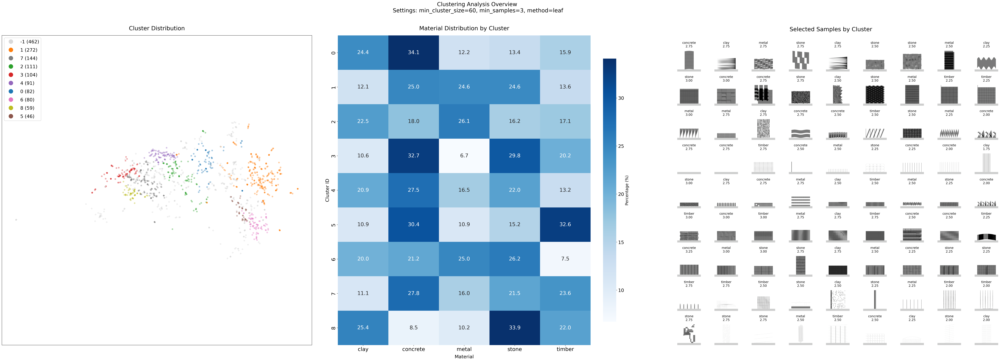

In [128]:
# ── COMBINED FIGURE: 3 COLUMN LAYOUT ──────────────────────────────────────
# Left: Cluster scatter | Middle: Material heatmap | Right: Sample images grid
# All three plots aligned with same height

num_sample_rows = selected_df.cluster.nunique()

# Create figure with 3 equal square columns
fig_height = 2.2 * num_sample_rows  # Scale height based on number of sample rows

# Calculate width to create 3 equal squares side by side
# Effective plot height accounts for top/bottom margins (top=0.93, bottom=0.05)
effective_plot_height = fig_height * (0.93 - 0.05)

# For 3 equal square columns with margins (left=0.05, right=0.98)
# Available width fraction = 0.93
# We want: (fig_width * 0.93) / 3 = effective_plot_height
# Therefore: fig_width = 3 * effective_plot_height / 0.93
fig_width = 3 * effective_plot_height / 0.93

# Create figure with calculated dimensions for perfect squares
fig = plt.figure(figsize=(fig_width, fig_height), dpi=200)

bottom_margin = 0.05  # Define bottom margin for gridspec

gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 1],
                       hspace=0, wspace=0.08,
                       left=0.05, right=0.98, top=0.88, bottom=bottom_margin)

# ═══════════════════════════════════════════════════════════════════════════
# 1. CLUSTER SCATTER PLOT (left column)
# ═══════════════════════════════════════════════════════════════════════════
ax_cluster = fig.add_subplot(gs[0, 0])

cluster_counts = df_plot.cluster.value_counts().to_dict()
def cluster_label(cid):
    return f"{cid} ({cluster_counts[cid]})"

tab10 = mpl.colormaps["tab10"]
cluster_palette = {-1: "#d9d9d9"}
for i, cid in enumerate(sorted(c for c in df_plot.cluster.unique() if c != -1)):
    cluster_palette[cid] = mpl.colors.to_hex(tab10(i % 10))

colour_vec = df_plot.cluster
colours = pd.Series(colour_vec).map(cluster_palette)
sc = ax_cluster.scatter(df_plot.x, df_plot.y, c=colours, s=DOT_SIZE*3.125, alpha=DOT_ALPHA, lw=0)

legend_labels = {cid: cluster_label(cid) for cid in df_plot.cluster.unique()}
freq = pd.Series(colour_vec).value_counts()
order = freq.index[:MAX_LEGEND]
handles = [
    plt.Line2D([], [], marker="o", ls="", color=cluster_palette[o], markersize=16)
    for o in order
]
ax_cluster.legend(
    handles,
    [legend_labels[o] for o in order],
    loc="upper left",
    frameon=True,
    fancybox=True,
    framealpha=0.95,
    fontsize=18,
    handletextpad=1.0,
    labelspacing=0.8
)
ax_cluster.set_title("Cluster Distribution", fontsize=22, pad=20)
ax_cluster.set(xticks=[], yticks=[])
ax_cluster.set_aspect('equal')  # Maintain square aspect
ax_cluster.set_box_aspect(1)  # Force square dimensions

# ═══════════════════════════════════════════════════════════════════════════
# 2. MATERIAL DISTRIBUTION HEATMAP (middle column)
# ═══════════════════════════════════════════════════════════════════════════
ax_heatmap = fig.add_subplot(gs[0, 1])

cluster_material_analysis = []
for cid in sorted(df_plot.cluster.unique()):
    if cid == -1:
        continue
    
    cluster_data = df_plot[df_plot.cluster == cid]
    total_in_cluster = len(cluster_data)
    material_counts = cluster_data['material'].value_counts()
    material_props = (material_counts / total_in_cluster * 100).round(1)
    
    for material, percentage in material_props.items():
        count = material_counts[material]
        cluster_material_analysis.append({
            'cluster': cid,
            'material': material,
            'count': count,
            'percentage': percentage,
            'cluster_size': total_in_cluster
        })

material_analysis_df = pd.DataFrame(cluster_material_analysis)
material_pivot = material_analysis_df.pivot_table(
    index='cluster', 
    columns='material', 
    values='percentage', 
    fill_value=0
).round(1)

material_pivot_sorted = material_pivot.sort_index(ascending=True)

# Create heatmap with colorbar closer to plot
sns.heatmap(material_pivot_sorted, annot=True, fmt='.1f', cmap='Blues', 
            annot_kws={'fontsize': 20},
            cbar_kws={'label': 'Percentage (%)', 'pad': 0.04, 'shrink': 0.85}, 
            ax=ax_heatmap)
ax_heatmap.set_title('Material Distribution by Cluster', fontsize=22, pad=20)
ax_heatmap.set_xlabel('Material', labelpad=10, fontsize=18)
ax_heatmap.set_ylabel('Cluster ID', fontsize=18)
ax_heatmap.tick_params(axis='both', labelsize=20)
# Set colorbar label fontsize
ax_heatmap.collections[0].colorbar.ax.set_ylabel('Percentage (%)', fontsize=15)
ax_heatmap.collections[0].colorbar.ax.tick_params(labelsize=18)
# Remove aspect constraints to allow vertical stretching for row alignment
ax_heatmap.yaxis.set_label_position("left")
ax_heatmap.yaxis.tick_left()

# ═══════════════════════════════════════════════════════════════════════════
# 3. SELECTED SAMPLES GRID (right column)
# ═══════════════════════════════════════════════════════════════════════════
# Add title above the samples grid
ax_samples_title = fig.add_subplot(gs[0, 2])
ax_samples_title.text(0.5, 1.01, 'Selected Samples by Cluster', 
                      ha='center', va='bottom', fontsize=22, fontweight='normal',
                      transform=ax_samples_title.transAxes)
ax_samples_title.axis('off')

gs_samples = gs[0, 2].subgridspec(num_sample_rows + 1, 11, hspace=0.50, wspace=-0.7,
                                   height_ratios=[0.08] + [1]*num_sample_rows,
                                   width_ratios=[0.25] + [1]*9 + [0.10])

for r, cid in enumerate(sorted(selected_df.cluster.unique())):
    row_df = selected_df[selected_df.cluster == cid].sort_values(
        "average_score", ascending=False
    )

    # Label in dedicated first column (r+1 to skip title row)
    ax_label = fig.add_subplot(gs_samples[r+1, 0])
    ax_label.text(0.5, 0.5, f"C {cid}", 
                  fontsize=16, fontweight='normal',
                  ha='center', va='center', rotation=0)
    ax_label.axis('off')

    # Image cells in columns 1-9
    for c, (_, item) in enumerate(row_df.iterrows()):
        ax_sample = fig.add_subplot(gs_samples[r+1, c+1])
        img = Image.open(item.render_image_path)
        ax_sample.imshow(img)
        ax_sample.set_aspect('equal')
        ax_sample.set_title(f"{item.material}\n{item.average_score:.2f}", fontsize=12, pad=2)
        ax_sample.axis("off")

    # Hide empty cells
    for c in range(len(row_df), 9):
        ax_sample = fig.add_subplot(gs_samples[r+1, c+1])
        ax_sample.axis("off")
    
    # Right margin column (empty)
    ax_margin = fig.add_subplot(gs_samples[r+1, 10])
    ax_margin.axis('off')

# Main title
fig.suptitle(
    f'Clustering Analysis Overview \n'
    f'Settings: min_cluster_size={min_cluster_size}, min_samples={min_samples}, method={method}',
    fontsize=21,
    y=0.97
)


# Save the combined figure
plt.savefig(
    f"{min_cluster_size}_{min_samples}_{method}_combined_linear.png",
    dpi=200,
    bbox_inches="tight",
)
plt.savefig(
    f"{min_cluster_size}_{min_samples}_{method}_combined_linear.pdf",
    dpi=200,
    bbox_inches="tight",
)

plt.show()